# Updates from last version  

* 14/06 - Basic explanation using Kernel SHAP
* 21/06 - improved on linguistic feature names.
* 23/06 - improved features names further by replacing `<UNK>` words
* 26/06 - improved features names further - include POS, CHUNK and predicted NER for raw word features
* 27/06 - split between true false predictions, investgate more where the word is not in embedding.
* 03/07 - trying aic and bic for l1 regularization in Kernel SHAP
* 06/07 - updating reference input for SHAP from `<PAD>` to `<UNK>`
* 22/07 - last epoch model and consistency in result reproducibility
* 23/07 - bringing all together will less instances for comparison

In [1]:
%env PYTHONHASHSEED=0

env: PYTHONHASHSEED=0


In [2]:
import pandas as pd
import collections
import pickle

from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.models import load_model
from keras_contrib.layers import CRF
from keras_contrib.losses import crf_loss
from keras_contrib.metrics import crf_accuracy, crf_marginal_accuracy, crf_viterbi_accuracy

from seqeval.metrics import precision_score, recall_score, f1_score, classification_report

from ner_util import pre_process_data_ner, \
                        iob_to_iob2,\
                        SentenceGetter, \
                        format_aux_input, \
                        reduce_sentence_length_by_word, \
                        pred2label, \
                        sent2features, \
                        get_f1

Using TensorFlow backend.


In [3]:
# file paths
validation_iob_tagged_file = '../data/CoNLL-2003/eng.testa'
save_best_weights = '../models/ner/bi_lstm_crf_last_epoch_weights.h5'
# '../models/ner/bi_lstm_crf_weights.h5'
vocab2int_path = '../models/ner_bilstm_crf_train_vocab2int.pkl'
# oh_encoder_path = '../models/ner_bilstm_crf_trained_oh_encoder.pkl'
# standard_transformer_path = '../models/ner_bilstm_crf_trained_standard_transform.pkl'
preprocess_transformer_path = '../models/ner_bilstm_crf_trained_pre-proc_transform.pkl'
tag2idx_path = '../models/ner_bilstm_crf_tag2idx.pkl'
idx2tag_path = '../models/ner_bilstm_crf_idx2tag.pkl'

In [4]:
# other configurations
max_words = 25
max_len = 25
n_tags = 9
num_word_prev = 5
num_word_next = 5

## Load models

In [5]:
with (open(vocab2int_path, "rb")) as _openfile:
    vocab_to_int = pickle.load(_openfile)

In [6]:
with (open(preprocess_transformer_path, "rb")) as _openfile:
    trained_preprocess_transform = pickle.load(_openfile)

In [7]:
with (open(tag2idx_path, "rb")) as _openfile:
    tag2idx = pickle.load(_openfile)

In [8]:
tag2idx

{'B-PER': 0,
 'B-ORG': 1,
 'I-PER': 2,
 'B-MISC': 3,
 'I-ORG': 4,
 'I-LOC': 5,
 'I-MISC': 6,
 'O': 7,
 'B-LOC': 8}

In [9]:
with (open(idx2tag_path, "rb")) as _openfile:
    idx2tag = pickle.load(_openfile)

In [10]:
idx2tag

{0: 'B-PER',
 1: 'B-ORG',
 2: 'I-PER',
 3: 'B-MISC',
 4: 'I-ORG',
 5: 'I-LOC',
 6: 'I-MISC',
 7: 'O',
 8: 'B-LOC'}

In [11]:
import numpy as np
import tensorflow as tf
import random as python_random

# The below is necessary for starting Numpy generated random numbers
# in a well-defined initial state.
np.random.seed(123)

# The below is necessary for starting core Python generated random numbers
# in a well-defined state.
python_random.seed(123)

# The below set_seed() will make random number generation
# in the TensorFlow backend have a well-defined initial state.
# For further details, see:
# https://www.tensorflow.org/api_docs/python/tf/random/set_seed
tf.set_random_seed(1234)

In [12]:
model = load_model(save_best_weights,custom_objects={'CRF': CRF,
                               'crf_loss': crf_loss,
                               'crf_viterbi_accuracy': crf_viterbi_accuracy,
                                'crf_marginal_accuracy':crf_marginal_accuracy,
                                'get_f1': get_f1})

## Hold out dataset

In [13]:
validate_iob_tag_df = pd.read_csv(validation_iob_tagged_file,delimiter=' ',skip_blank_lines=False, 
                                  header = None, names = ['word','pos','chunk','tag'])
validate_iob_tag_df.head()

,word,pos,chunk,tag
0,-DOCSTART-,-X-,O,O
1,NaN,NaN,NaN,NaN
2,CRICKET,NNP,I-NP,O
3,-,:,O,O
4,LEICESTERSHIRE,NNP,I-NP,I-ORG


In [14]:
validate_iob_tagged_df_cleaned = pre_process_data_ner(validate_iob_tag_df)
validate_iob_tagged_df_cleaned.isna().sum()

word            0
pos             0
chunk           0
tag             0
sentence_num    0
doc_num         0
dtype: int64

In [15]:
validate_tag_counts = collections.Counter(validate_iob_tagged_df_cleaned["tag"])
validate_tag_counts

Counter({'O': 42120,
         'I-ORG': 2092,
         'I-LOC': 2094,
         'I-MISC': 1264,
         'I-PER': 3145,
         'B-MISC': 4})

In [16]:
validate_iob_tagged_df_cleaned["iob2_tag"] = iob_to_iob2(validate_iob_tagged_df_cleaned)
validate_iob_tagged_df_cleaned["iob2_chunk"] = iob_to_iob2(validate_iob_tagged_df_cleaned,'chunk')
validate_iob_tagged_df_cleaned.head()

,word,pos,chunk,tag,sentence_num,doc_num,iob2_tag,iob2_chunk
2,CRICKET,NNP,I-NP,O,0,0,O,B-NP
3,-,:,O,O,0,0,O,O
4,LEICESTERSHIRE,NNP,I-NP,I-ORG,0,0,B-ORG,B-NP
5,TAKE,NNP,I-NP,O,0,0,O,I-NP
6,OVER,IN,I-PP,O,0,0,O,B-PP


In [17]:
validate_iob_tagged_df_cleaned.drop(['chunk','tag'], axis = 1, inplace = True)
validate_iob_tagged_df_cleaned.rename(columns = {'iob2_tag':'tag',
                                              'iob2_chunk':'chunk'}, inplace = True)

In [18]:
validate_iob_tagged_df_cleaned_reduced = reduce_sentence_length_by_word(validate_iob_tagged_df_cleaned,
                                                                     max_words,'sentence_num')
validate_iob_tagged_df_cleaned_reduced.shape

(24988, 6)

In [19]:
#validate_iob_tagged_df_cleaned_reduced.to_csv('../data/explainable_ner/test_a.csv', index = False)

In [20]:
validate_tag_counts = collections.Counter(validate_iob_tagged_df_cleaned_reduced["tag"])
validate_tag_counts

Counter({'O': 20121,
         'B-ORG': 839,
         'B-LOC': 1180,
         'B-PER': 1008,
         'I-PER': 675,
         'B-MISC': 460,
         'I-MISC': 193,
         'I-LOC': 156,
         'I-ORG': 356})

In [21]:
validate_getter = SentenceGetter(validate_iob_tagged_df_cleaned_reduced)
validate_sentences = validate_getter.sentences

In [22]:
X_validate = [[vocab_to_int[w[0]] if w[0] in vocab_to_int.keys() else vocab_to_int['<UNK>'] for w in s]\
                                                            for s in validate_sentences]
X_validate = pad_sequences(maxlen = max_len, sequences = X_validate, 
                        padding  = 'post', value = vocab_to_int['<PAD>'])
len(X_validate[0])

25

In [23]:
y_validate = [[tag2idx[w[3]] for w in s] for s in validate_sentences]
y_validate = pad_sequences(maxlen = max_len, sequences = y_validate, padding  = 'post', value = tag2idx['O'])

In [24]:
y_validate = [to_categorical(i, num_classes = n_tags) for i in y_validate]

In [25]:
X_aux_validate =  [sent2features(s, num_word_prev, num_word_next, max_len) for s in validate_sentences]
len(X_aux_validate), len(X_aux_validate[0])

(2505, 25)

In [26]:
aux_validate_input, _ = format_aux_input(X_aux_validate, max_len = max_len,
                                     preproc_transform = trained_preprocess_transform)
              #oh_encoder = trained_oh_encoder, standard_transform = trained_standard_transform)
aux_validate_input.shape

D:\Anaconda\envs\XAI_NER\lib\site-packages\pandas\core\frame.py:4244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  **kwargs


(2505, 25, 2684)

In [27]:
validate_pred = model.predict([X_validate,aux_validate_input], verbose=1)

2505/2505 [==============================] - 17s 7ms/step


In [28]:
validate_pred.shape

(2505, 25, 9)

In [29]:
validate_pred_labels = pred2label(validate_pred, idx2tag)
validate_labels = pred2label(y_validate, idx2tag)

In [30]:
print("F1-score: {:.1%}".format(f1_score(validate_labels, validate_pred_labels)))
print(classification_report(validate_labels, validate_pred_labels))

F1-score: 81.7%
           precision    recall  f1-score   support

      LOC       0.93      0.86      0.89      1180
     MISC       0.69      0.79      0.73       460
      PER       0.75      0.85      0.80      1008
      ORG       0.77      0.81      0.79       839

micro avg       0.80      0.83      0.82      3487
macro avg       0.81      0.83      0.82      3487



## Prepare for explanation

We'll choose observations where there is at least one predicted entity of type location (best performing) or misc (worst performing) and where the probability score is more than 0.95.  
Then we'll need to choose the pair of tags for comparison. The output of this activity should be a data frame containing:
- sentence in raw form
- word index in the sentence for B-LOC / I-LOC tag (having probability more than 0.95)
- whether the prediction is correct
- the other tag for comparison
- word index in the sentence for B-MISC / I-MISC tag (having probability more than 0.95)
- whether the prediction is correct
- the other tag for comparison

In [31]:
import numpy as np
import random
from explanation_util import get_entity_prediction, \
                            get_explanation_instances

In [32]:
len(validate_iob_tagged_df_cleaned_reduced.sentence_num.unique())

2505

In [33]:
validate_entity_prob_mat, idx2ent = get_entity_prediction(validate_pred, idx2tag)
validate_true_entity_prob_mat, idx2ent_true = get_entity_prediction(y_validate, idx2tag)
validate_pred.shape, validate_entity_prob_mat.shape, validate_true_entity_prob_mat.shape, len(idx2ent)

((2505, 25, 9), (2505, 25, 5), (2505, 25, 5), 5)

In [34]:
all_dict = get_explanation_instances(validate_entity_prob_mat, validate_true_entity_prob_mat, idx2ent,
                                               idx2ent_true, selection_prob = 0.0)

In [35]:
print_dict = {k:v for i,(k,v) in enumerate(all_dict.items()) if i < 5}
print_dict

{(1, 'LOC', 0.999647855758667): {'word_indx': [0],
  'p_i': 1,
  'p_i_next': 2,
  'pred_tag_next': 'ORG',
  'p_next': 4.137176074436866e-05,
  'is_accurate': True,
  'actual_tag': ['LOC']},
 (3, 'LOC', 0.9548021554946899): {'word_indx': [5],
  'p_i': 1,
  'p_i_next': 2,
  'pred_tag_next': 'ORG',
  'p_next': 0.04265204444527626,
  'is_accurate': True,
  'actual_tag': ['LOC']},
 (6, 'MISC', 0.9963244597117106): {'word_indx': [2, 3, 4],
  'p_i': 3,
  'p_i_next': 4,
  'pred_tag_next': 'O',
  'p_next': 0.0013070780632915557,
  'is_accurate': True,
  'actual_tag': ['MISC', 'MISC', 'MISC']},
 (7, 'LOC', 0.999647855758667): {'word_indx': [0],
  'p_i': 1,
  'p_i_next': 2,
  'pred_tag_next': 'ORG',
  'p_next': 4.137176074436866e-05,
  'is_accurate': True,
  'actual_tag': ['LOC']},
 (8, 'MISC', 0.9997474551200867): {'word_indx': [7],
  'p_i': 3,
  'p_i_next': 4,
  'pred_tag_next': 'O',
  'p_next': 3.234080577385612e-05,
  'is_accurate': True,
  'actual_tag': ['MISC']}}

In [36]:
sent_getter_id_dict = {" ".join([x[0] for x in text]):i for i, text in enumerate(validate_sentences)}

In [37]:
sent_word_getter_id_dict = {i:{(j,words[0]):words for j, words in enumerate(text)} for i, text in enumerate(validate_sentences)}

In [38]:
sent_word_getter_id_dict[10]

{(0, 'Somerset'): ('Somerset', 'NNP', 'B-NP', 'B-ORG'),
 (1, '83'): ('83', 'CD', 'I-NP', 'O'),
 (2, 'and'): ('and', 'CC', 'I-NP', 'O'),
 (3, '174'): ('174', 'CD', 'I-NP', 'O'),
 (4, '('): ('(', '(', 'O', 'O'),
 (5, 'P.'): ('P.', 'NNP', 'B-NP', 'B-PER'),
 (6, 'Simmons'): ('Simmons', 'NNP', 'I-NP', 'I-PER'),
 (7, '4-38'): ('4-38', 'CD', 'I-NP', 'O'),
 (8, ')'): (')', ')', 'O', 'O'),
 (9, ','): (',', ',', 'O', 'O'),
 (10, 'Leicestershire'): ('Leicestershire', 'NNP', 'B-NP', 'B-ORG'),
 (11, '296'): ('296', 'CD', 'I-NP', 'O'),
 (12, '.'): ('.', '.', 'O', 'O')}

## Kernel SHAP for NER

In [151]:
sentence = "His aides said Arafat would hold the weekly meeting of the Palestinian self-rule Authority 's cabinet in Nablus on Saturday ."
entity_tag = 'LOC'
len(all_dict)

1597

In [152]:
sent_indx = sent_getter_id_dict[sentence]
selected_dict = {k:v for k, v in all_dict.items() if k[0] == sent_indx and k[1] == entity_tag and k[2] <0.5}
selected_dict

{(1237, 'LOC', 0.3667409420013428): {'word_indx': [17],
  'p_i': 1,
  'p_i_next': 0,
  'pred_tag_next': 'PER',
  'p_next': 0.26681098341941833,
  'is_accurate': True,
  'actual_tag': ['LOC']}}

In [153]:
selected_dict.keys()

dict_keys([(1237, 'LOC', 0.3667409420013428)])

In [154]:
from explanation_util import NER_KSHAPExplainerGenerator

In [155]:
KSHAP_explainer_generator = NER_KSHAPExplainerGenerator(model, vocab_to_int, tag2idx, max_len, 
                                            sent_getter_id_dict, sent_word_getter_id_dict,
                                            validate_sentences, trained_preprocess_transform,
                                                       num_word_next = num_word_next,
                num_word_prev = num_word_prev)

In [156]:
# ref_text = "<PAD>"
# changed from <PAD>
ref_text = ("<UNK> " * max_words).strip()
ref_flat_input, _ = KSHAP_explainer_generator.preprocess([ref_text])
ref_flat_input.shape


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1/1 [==============================] - 0s 432ms/step


(1, 67125)

## LIME for NER

In [157]:
from lime.lime_text import LimeTextExplainer
from explanation_util import NER_LIMEExplainerGenerator

In [158]:
LIME_explainer_generator = NER_LIMEExplainerGenerator(model, vocab_to_int, tag2idx, max_len, 
                                            sent_getter_id_dict, sent_word_getter_id_dict,
                                            validate_sentences, trained_preprocess_transform,
                                                     num_word_next = num_word_next,
                num_word_prev = num_word_prev)

In [159]:
# classes and the entity names
LIME_explainer = LimeTextExplainer(class_names=list(idx2ent.values()),bow = False, split_expression= " ")


## LIME-NER for NER

In [160]:
#from lime.lime_text import LimeTextExplainer
# this is importing lime_ner from https://github.com/sofiaherrero/lime-ner
#from lime_ner.lime_text import LimeTextExplainer as LIMENERTextExplainer

In [161]:
#LIME_NER_explainer = LIMENERTextExplainer(class_names=list(idx2ent.values()),bow = False, split_expression= " ")
# had to add split_expression= " " for LIME NER on multi word

### Visualize explanations

In [162]:
from explanation_validation_util import visualize_LIME_explanations, \
                                        visualize_kernel_shap_explanation

import shap

In [163]:
#visualize_LIME_explanations(LIME_explainer_generator, LIME_NER_explainer, validate_sentences, selected_dict, LIME_NER = True)

In [164]:
visualize_LIME_explanations(LIME_explainer_generator, LIME_explainer, validate_sentences, selected_dict, min_length = 0)


Sentence for explanation: His aides said Arafat would hold the weekly meeting of the Palestinian self-rule Authority 's cabinet in Nablus on Saturday .
Word for explanation: Nablus
Predicted named entity for the words: LOC
Actual named entity for the words: LOC


split() requires a non-empty pattern match.

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Sentence for explanation: His aides said Arafat would hold the weekly meeting of the Palestinian self-rule Authority 's cabinet in Nablus on Saturday .
Word for explanation: Nablus
Predicted named entity for the words: LOC
Actual named entity for the words: LOC
1/1 [==============================] - 0s 91ms/step



A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Force plot for entity LOC:


Top 10 features and SHAP values for entity LOC:


,1
in>16>IN>O,2.477186
cabinet>15>NN>O,1.249240
Authority>13>NNP>ORG,0.473262
Palestinian>11>JJ>ORG,0.248042
's>14>POS>O,0.226651
self-rule>12>JJ>ORG,0.206181
on>18>IN>O,0.196998
.>20>.>O,-0.349207
<PAD>>24>>O,-0.583113
<PAD>>23>>O,-0.694528


Multiple output decision ploit highlighting entity LOC and PER:


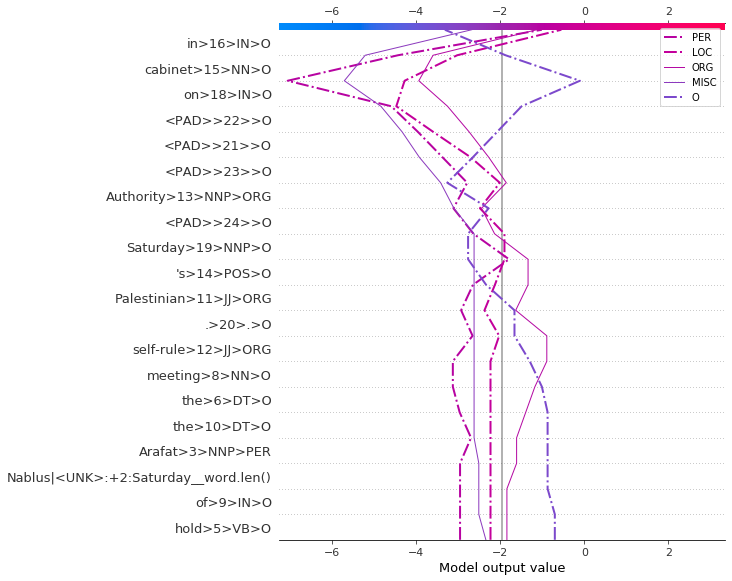

Summary plot with top 10 features and for entity LOC:


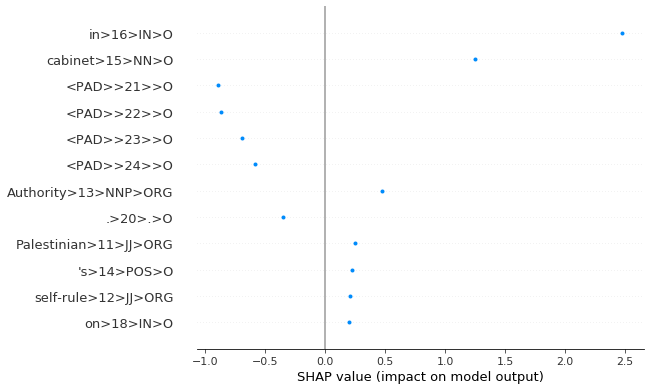

None

Summary plot for all classes together:


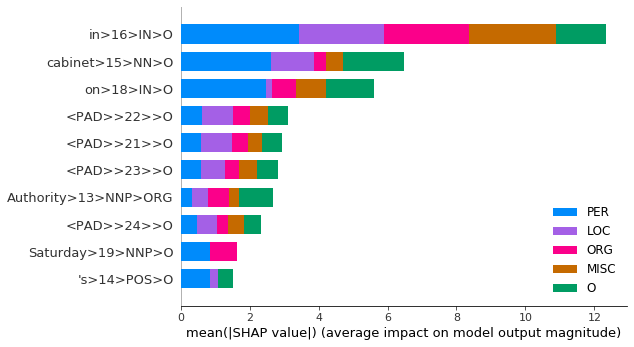

None

top 10 fetures and SHAP values for all classes together


,PER,LOC,ORG,MISC,O
in>16>IN>O,3.420086,2.477186,2.463534,2.530047,-1.442785
cabinet>15>NN>O,2.621187,1.249240,0.338870,0.495836,-1.767791
on>18>IN>O,-2.462521,0.196998,-0.682103,-0.868809,1.386082
<PAD>>22>>O,-0.630690,-0.873760,-0.511242,-0.503211,0.579505
<PAD>>21>>O,-0.587178,-0.892595,-0.468593,-0.411113,0.579338
<PAD>>23>>O,-0.587533,-0.694528,-0.416859,-0.506477,0.609035
Authority>13>NNP>ORG,0.328054,0.473262,0.588107,-0.314973,-0.983671
<PAD>>24>>O,-0.476060,-0.583113,-0.309908,-0.479491,0.487805
Saturday>19>NNP>O,-0.846482,0.000000,-0.795960,0.000000,0.000000
's>14>POS>O,0.856547,0.226651,0.000000,0.000000,-0.427507


In [165]:
# init the JS visualization code
shap.initjs()
visualize_kernel_shap_explanation(KSHAP_explainer_generator, ref_flat_input,validate_sentences,
                                  idx2ent, selected_dict, additional_highlight = 'O', 
                                  multiplot_legend_location='upper right', min_length = 0)

## For unknown entity words

In [51]:
unkown_word_entity_dict = {}
for k, v_dict in all_dict.items():   
    word_list = [validate_sentences[k[0]][word_Idx][0] for word_Idx in v_dict['word_indx']]
    if not any(elem in vocab_to_int.keys() for elem in word_list): 
        unkown_word_entity_dict[k] = v_dict 
        
len(unkown_word_entity_dict)

114

In [52]:
unknown_accurate_dict = {key: unkown_word_entity_dict[key] 
                                for key in unkown_word_entity_dict.keys()
                                if unkown_word_entity_dict[key]['is_accurate']}

# expl_selected_multiword_wrong_dict = {key: expl_selected_multiword_dict[key] 
#                                 for key in expl_selected_multiword_dict.keys()
#                                 if not expl_selected_multiword_dict[key]['is_accurate']}

unknown_wrong_dict = {key: unkown_word_entity_dict[key] 
                                for key in unkown_word_entity_dict.keys()
                                if not unkown_word_entity_dict[key]['is_accurate']}

len(unknown_accurate_dict),len(unknown_wrong_dict)

(30, 84)

In [53]:
unknown_MISC_accurate_dict = {key: unknown_accurate_dict[key] 
                                for key in unknown_accurate_dict.keys()
                                if key[1] == 'MISC'}
unknown_MISC_inaccurate_dict = {key: unknown_wrong_dict[key] 
                                for key in unknown_wrong_dict.keys()
                                if key[1] == 'MISC'}

len(unknown_MISC_accurate_dict),len(unknown_MISC_inaccurate_dict)

(6, 71)

In [54]:
unknown_LOC_accurate_dict = {key: unknown_accurate_dict[key] 
                                for key in unknown_accurate_dict.keys()
                                if key[1] == 'LOC'}
unknown_LOC_inaccurate_dict = {key: unknown_wrong_dict[key] 
                                for key in unknown_wrong_dict.keys()
                                if key[1] == 'LOC'}

len(unknown_LOC_accurate_dict),len(unknown_LOC_inaccurate_dict)

(24, 13)

In [55]:
unknown_LOC_inaccurate_dict

{(293, 'LOC', 0.40251192450523376): {'word_indx': [0],
  'p_i': 1,
  'p_i_next': 3,
  'pred_tag_next': 'MISC',
  'p_next': 0.3811022937297821,
  'is_accurate': False,
  'actual_tag': ['O']},
 (502, 'LOC', 0.26167166233062744): {'word_indx': [0],
  'p_i': 1,
  'p_i_next': 3,
  'pred_tag_next': 'MISC',
  'p_next': 0.24582527577877045,
  'is_accurate': False,
  'actual_tag': ['PER']},
 (597, 'LOC', 0.3424198031425476): {'word_indx': [0],
  'p_i': 1,
  'p_i_next': 4,
  'pred_tag_next': 'O',
  'p_next': 0.2621420621871948,
  'is_accurate': False,
  'actual_tag': ['O']},
 (1061, 'LOC', 0.597575843334198): {'word_indx': [2],
  'p_i': 1,
  'p_i_next': 2,
  'pred_tag_next': 'ORG',
  'p_next': 0.2500053346157074,
  'is_accurate': False,
  'actual_tag': ['ORG']},
 (1154, 'LOC', 0.41974055767059326): {'word_indx': [0],
  'p_i': 1,
  'p_i_next': 4,
  'pred_tag_next': 'O',
  'p_next': 0.22748583555221558,
  'is_accurate': False,
  'actual_tag': ['O']},
 (1157, 'LOC', 0.3800455331802368): {'word_indx

In [ ]:
sent_indx = sent_getter_id_dict[sentence]
sent_indx

In [56]:
sent_indx = 2501
entity_tag = 'LOC'
selected_unkown_dict = {k:v for k, v in all_dict.items() if k[0] == sent_indx and k[1] == entity_tag and k[2] <0.9}
selected_unkown_dict

{(2501, 'LOC', 0.6769565343856812): {'word_indx': [5],
  'p_i': 1,
  'p_i_next': 0,
  'pred_tag_next': 'PER',
  'p_next': 0.2420290857553482,
  'is_accurate': False,
  'actual_tag': ['ORG']}}

In [57]:
visualize_LIME_explanations(LIME_explainer_generator, LIME_explainer, validate_sentences, selected_unkown_dict, min_length = 0)


Sentence for explanation: Brokers said blue chips like IDLC , Bangladesh Lamps , Chittagong Cement and Atlas Bangladesh were expected to rise .
Word for explanation: IDLC
Predicted named entity for the words: LOC
Actual named entity for the words: ORG


split() requires a non-empty pattern match.

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Sentence for explanation: Brokers said blue chips like IDLC , Bangladesh Lamps , Chittagong Cement and Atlas Bangladesh were expected to rise .
Word for explanation: IDLC
Predicted named entity for the words: LOC
Actual named entity for the words: ORG



A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


1/1 [==============================] - 0s 295ms/step



Force plot for entity LOC:


Top 10 features and SHAP values for entity LOC:


,1
Bangladesh>7>NNP>LOC,1.565729
like>4>IN>O,1.093867
Bangladesh>14>NNP>LOC,1.003565
Cement>11>NNP>ORG,0.316178
Atlas>13>NNP>LOC,0.204006
blue:-2:Brokers__word.isdigit()_True,-0.104605
were:+5:<PAD>__has_number_True,-0.108938
expected:-2:Bangladesh__word.len(),-0.134902
were>15>VBD>O,-0.143221
rise>18>VB>O,-0.145501


Multiple output decision ploit highlighting entity LOC and PER:


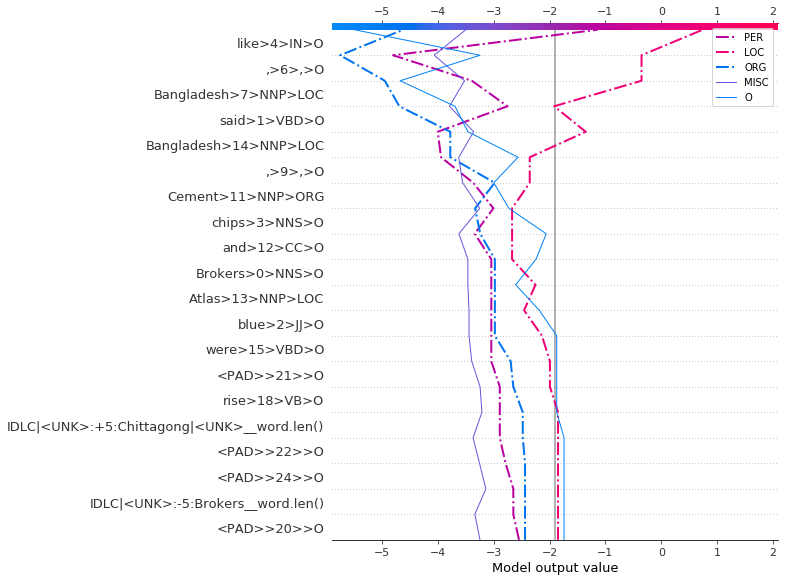

Summary plot with top 10 features and for entity LOC:


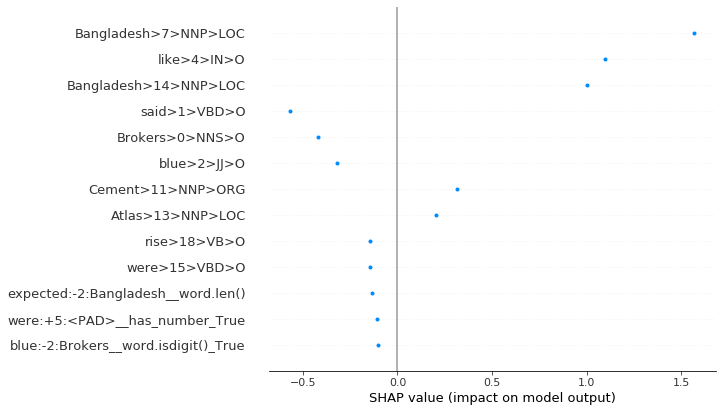

None

Summary plot for all classes together:


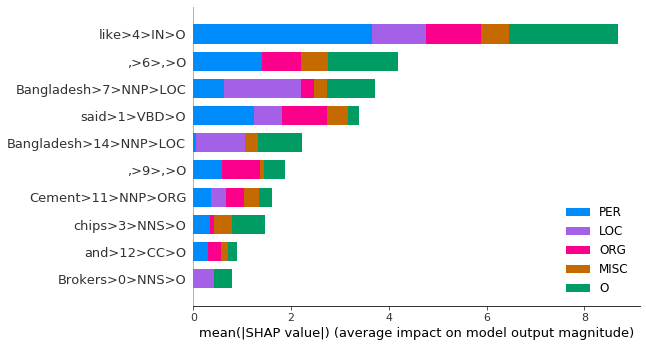

None

top 10 fetures and SHAP values for all classes together


,PER,LOC,ORG,MISC,O
like>4>IN>O,3.663796,1.093867,1.127001,0.566556,-2.246853
",>6>,>O",-1.412044,0.000000,-0.799512,-0.545286,1.432701
Bangladesh>7>NNP>LOC,-0.637679,1.565729,-0.260458,0.270518,-0.983244
said>1>VBD>O,1.250225,-0.566150,-0.913339,-0.434154,-0.232635
Bangladesh>14>NNP>LOC,-0.059323,1.003565,0.000000,0.267654,-0.897052
...,...,...,...,...,...
<PAD>__EOS-2_NA,0.000000,0.000000,0.000000,-0.009337,0.000000
<PAD>:-1:<PAD>__postag_NA,0.000000,0.000000,0.000000,-0.008879,0.000000
Brokers:+4:like__word.len(),0.000000,0.000000,0.000000,-0.008336,0.000000
<PAD>__word_format_NA,0.000000,0.000000,0.000000,-0.005204,0.000000


In [58]:
# init the JS visualization code
shap.initjs()
visualize_kernel_shap_explanation(KSHAP_explainer_generator, ref_flat_input,validate_sentences,
                                  idx2ent, selected_unkown_dict, additional_highlight = 'ORG', 
                                  min_length = 0, multiplot_legend_location='upper right')